In [2]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [3]:
train='fruits-360/Training'
file_names=os.listdir(train)
pd.DataFrame(file_names,columns=['Names'])

,Names
0,Apple Braeburn
1,Apple Golden 1
2,Apple Golden 2
3,Apple Golden 3
4,Apple Granny Smith
...,...
65,Salak
66,Strawberry
67,Strawberry Wedge
68,Tamarillo


In [4]:
size_number=[]
size=[]
for file in file_names:
    path=os.path.join(train,file)
    size_number.append(len(os.listdir(path)))
    for img in os.listdir(path):
        image=cv2.imread(os.path.join(path,img))
        size.append(image.shape)
pd.DataFrame(size_number,columns=['size'],index=file_names) 

,size
Apple Braeburn,492
Apple Golden 1,492
Apple Golden 2,492
Apple Golden 3,481
Apple Granny Smith,492
...,...
Salak,490
Strawberry,492
Strawberry Wedge,738
Tamarillo,490


<Axes: ylabel='Count'>

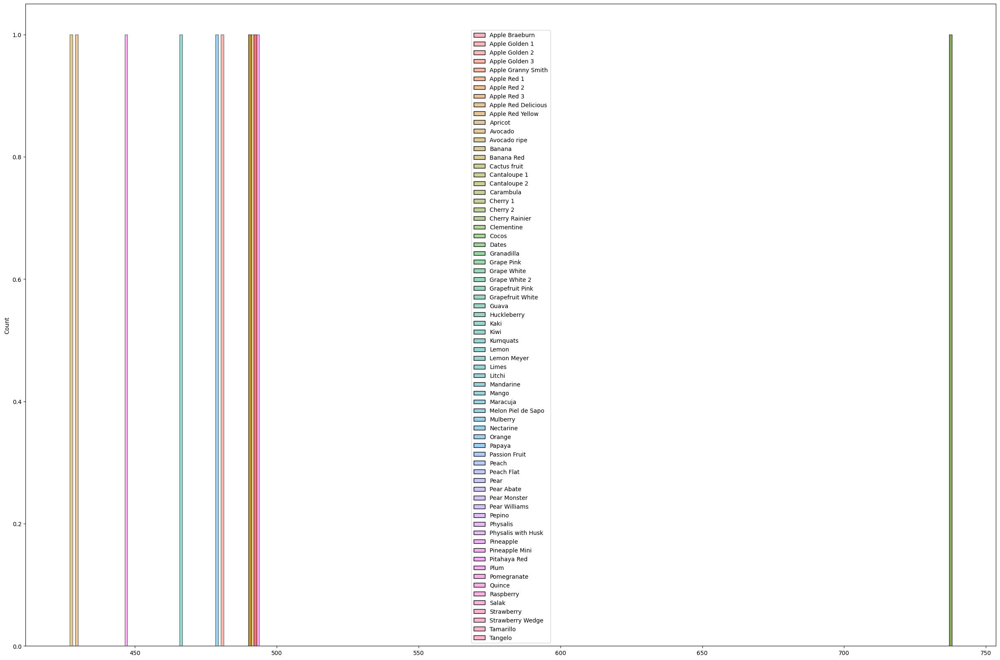

In [5]:
plt.figure(figsize=(30,20))
sns.histplot(x=size_number,hue=file_names)

([<matplotlib.patches.Wedge at 0x145d9eb9ad0>,
 [Text(1.0989356312579608, 0.04837849058897586, 'Apple Braeburn'),
  Text(1.090433036035364, 0.1447611616515231, 'Apple Golden 1'),
  Text(1.0734936311771182, 0.24002379844958227, 'Apple Golden 2'),
  Text(1.0485759392572327, 0.3323981041023134, 'Apple Golden 3'),
  Text(1.015725550489177, 0.42225774839955127, 'Apple Granny Smith'),
  Text(0.974689926868728, 0.5098818946193654, 'Apple Red 1'),
  Text(0.9261130117658833, 0.5935610241903733, 'Apple Red 2'),
  Text(0.8741461538142866, 0.6677338554931073, 'Apple Red 3'),
  Text(0.8163856265710319, 0.7372343648584375, 'Apple Red Delicious'),
  Text(0.7485864993862839, 0.8059889905802619, 'Apple Red Yellow'),
  Text(0.6748636366749149, 0.8686535971800893, 'Apricot'),
  Text(0.6012832143142245, 0.9211180685362516, 'Avocado'),
  Text(0.5237310770049936, 0.9673188507308177, 'Avocado ripe'),
  Text(0.43697191124578716, 1.0094828125244155, 'Banana'),
  Text(0.3469457546051276, 1.0438527881657829, 'Ba

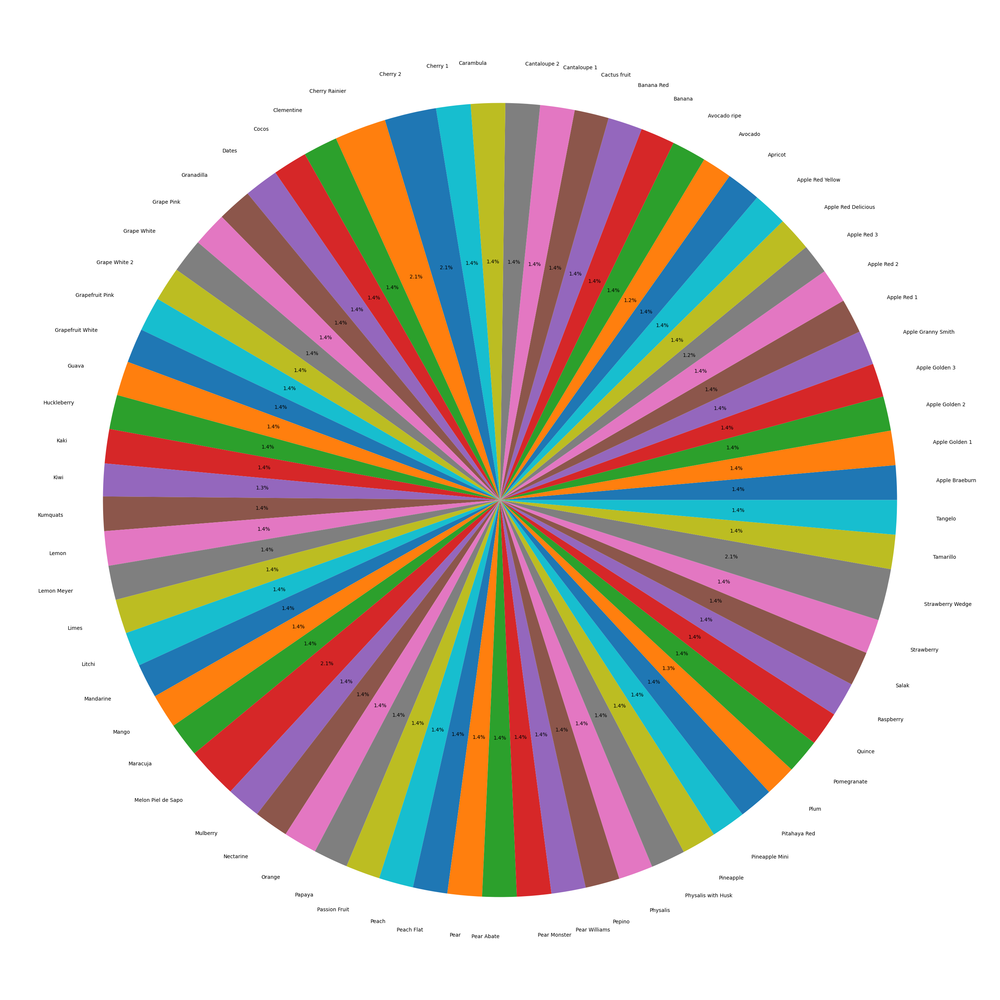

In [5]:
plt.figure(figsize=(50,35))
plt.pie(x=size_number,labels=file_names,autopct ='%1.1f%%')

In [6]:
pd.DataFrame(pd.Series(size).value_counts(),columns=['Number']) 

,Number
"(100, 100, 3)",35133


In [7]:
train_image=[]
label=[]
for file in file_names:
    path=os.path.join(train,file)
    for img in os.listdir(path):
        image=cv2.imread(os.path.join(path,img))
        train_image.append(image)
        label.append(file)
pd.DataFrame(label,columns=['label']) 

,label
0,Apple Braeburn
1,Apple Braeburn
2,Apple Braeburn
3,Apple Braeburn
4,Apple Braeburn
...,...
35128,Tangelo
35129,Tangelo
35130,Tangelo
35131,Tangelo


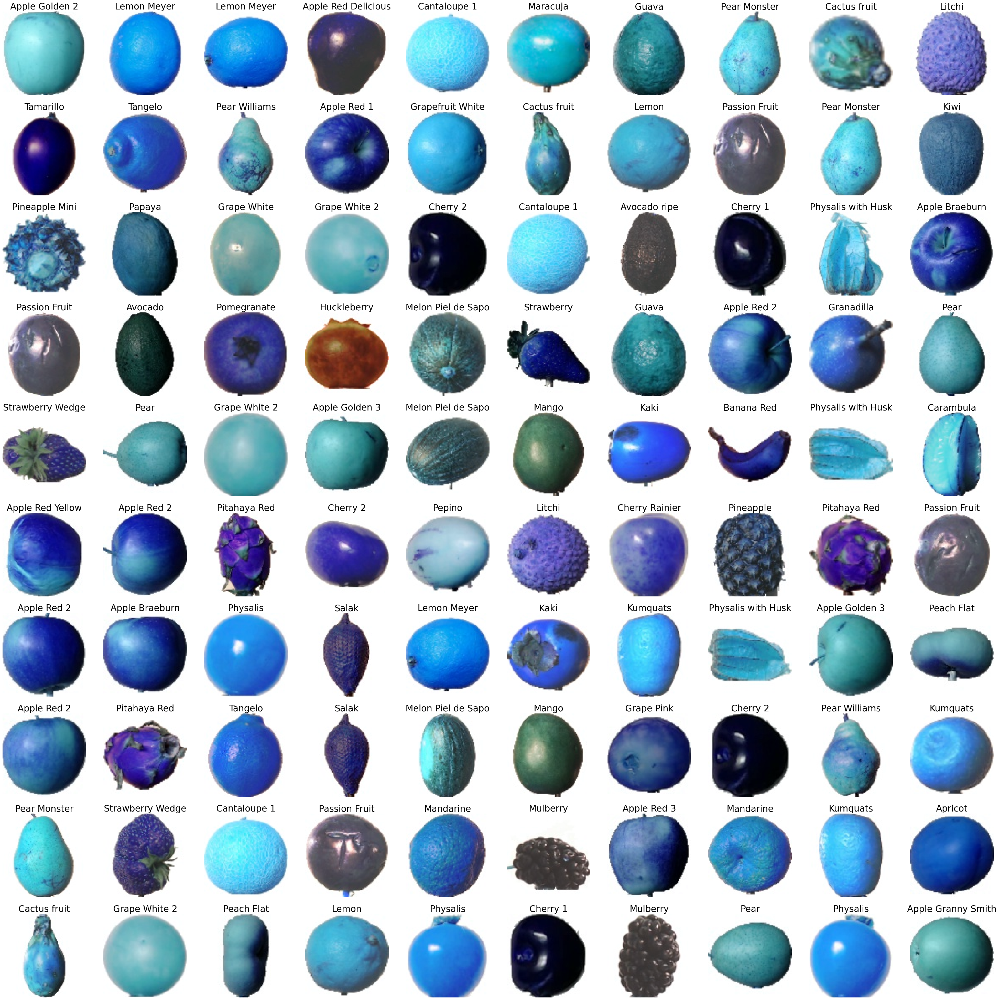

In [8]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(train_image),100)):
    plt.subplot(10,10,n+1)
    plt.imshow(train_image[i])
    plt.axis('off')
    plt.title(label[i],fontsize=25)

In [9]:
train_image=np.array(train_image)
label=np.array(label)

In [11]:
code={}
label_uniqe=list(pd.unique(label))
for i in range(70):
    code[label_uniqe[i]]=i
code 

{'Apple Braeburn': 0,
 'Apple Golden 1': 1,
 'Apple Golden 2': 2,
 'Apple Golden 3': 3,
 'Apple Granny Smith': 4,
 'Apple Red 1': 5,
 'Apple Red 2': 6,
 'Apple Red 3': 7,
 'Apple Red Delicious': 8,
 'Apple Red Yellow': 9,
 'Apricot': 10,
 'Avocado': 11,
 'Avocado ripe': 12,
 'Banana': 13,
 'Banana Red': 14,
 'Cactus fruit': 15,
 'Cantaloupe 1': 16,
 'Cantaloupe 2': 17,
 'Carambula': 18,
 'Cherry 1': 19,
 'Cherry 2': 20,
 'Cherry Rainier': 21,
 'Clementine': 22,
 'Cocos': 23,
 'Dates': 24,
 'Granadilla': 25,
 'Grape Pink': 26,
 'Grape White': 27,
 'Grape White 2': 28,
 'Grapefruit Pink': 29,
 'Grapefruit White': 30,
 'Guava': 31,
 'Huckleberry': 32,
 'Kaki': 33,
 'Kiwi': 34,
 'Kumquats': 35,
 'Lemon': 36,
 'Lemon Meyer': 37,
 'Limes': 38,
 'Litchi': 39,
 'Mandarine': 40,
 'Mango': 41,
 'Maracuja': 42,
 'Melon Piel de Sapo': 43,
 'Mulberry': 44,
 'Nectarine': 45,
 'Orange': 46,
 'Papaya': 47,
 'Passion Fruit': 48,
 'Peach': 49,
 'Peach Flat': 50,
 'Pear': 51,
 'Pear Abate': 52,
 'Pear Mo

In [12]:
def get_Name(N):
    for x,y in code.items():
          if y==N:
                return x
label2=[]
for i in label:
    label2.append(code[i])
label2=np.array(label2)
pd.DataFrame(label2)

,0
0,0
1,0
2,0
3,0
4,0
...,...
35128,69
35129,69
35130,69
35131,69


In [13]:
X_train, X_test, y_train, y_test = train_test_split(train_image, label2, test_size=0.3, random_state=44, shuffle =True)
print('X_train shape is ' , X_train.shape)
print('X_test shape is ' , X_test.shape)
print('y_train shape is ' , y_train.shape)
print('y_test shape is ' , y_test.shape)

X_train shape is  (24593, 100, 100, 3)
X_test shape is  (10540, 100, 100, 3)
y_train shape is  (24593,)
y_test shape is  (10540,)


In [15]:
shape=(100,100,3)
num_class=70
model=keras.models.Sequential()
model.add(keras.layers.Conv2D(filters=32, kernel_size=(3,3),activation=tf.nn.relu,input_shape=shape))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((3,3))) 
model.add(keras.layers.Dropout(.3)) 
model.add(keras.layers.Conv2D(filters=64, kernel_size=(3,3),activation=tf.nn.relu)) 
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((3,3))) 
model.add(keras.layers.Dropout(.3)) 
model.add(keras.layers.Conv2D(filters=128, kernel_size=(3,3),activation=tf.nn.relu))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((3,3))) 
model.add(keras.layers.Dropout(.3)) 
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(512,activation=tf.nn.relu))
model.add(keras.layers.Dropout(.3)) 
model.add(keras.layers.Dense(128,activation=tf.nn.relu)) 
model.add(keras.layers.Dropout(.3)) 
model.add(keras.layers.Dense(num_class,activation=tf.nn.softmax))

In [16]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 98, 98, 32)        896       
                                                                 
 batch_normalization_3 (Batc  (None, 98, 98, 32)       128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 32, 32, 32)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 30, 30, 64)        18496     
                                                                 
 batch_normalization_4 (Batc  (None, 30, 30, 64)      

In [17]:
model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
hist=model.fit(X_train,y_train,epochs=10)

Epoch 1/10
769/769 [==============================] - 82s 105ms/step - loss: 1.3872 - accuracy: 0.6031
Epoch 2/10
769/769 [==============================] - 82s 106ms/step - loss: 0.3506 - accuracy: 0.8835
Epoch 3/10
769/769 [==============================] - 88s 114ms/step - loss: 0.2287 - accuracy: 0.9212
Epoch 4/10
769/769 [==============================] - 87s 113ms/step - loss: 0.1671 - accuracy: 0.9419
Epoch 5/10
769/769 [==============================] - 88s 114ms/step - loss: 0.1408 - accuracy: 0.9517
Epoch 6/10
769/769 [==============================] - 88s 114ms/step - loss: 0.1345 - accuracy: 0.9556
Epoch 7/10
769/769 [==============================] - 88s 114ms/step - loss: 0.1237 - accuracy: 0.9594
Epoch 8/10
769/769 [==============================] - 87s 114ms/step - loss: 0.1076 - accuracy: 0.9648
Epoch 9/10
769/769 [==============================] - 87s 114ms/step - loss: 0.1068 - accuracy: 0.9634
Epoch 10/10
769/769 [==============================] - 87s 113ms/step - l

In [18]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy
0,1.387184,0.603139
1,0.350638,0.883544
2,0.228691,0.921197
3,0.167084,0.941894
4,0.140770,0.951653
5,0.134451,0.955556
6,0.123738,0.959379
7,0.107641,0.964787
8,0.106766,0.963404
9,0.100594,0.966942


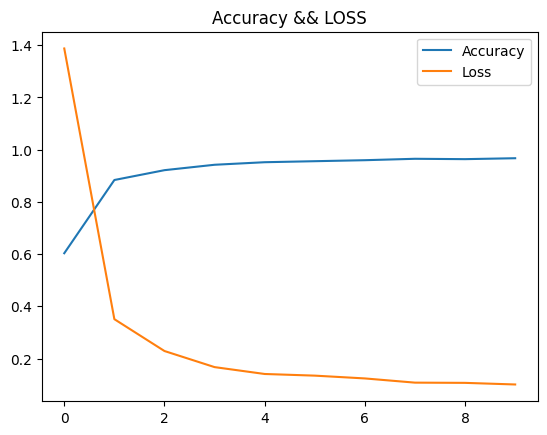

In [19]:
plt.plot(hist_['accuracy'],label='Accuracy')
plt.plot(hist_['loss'],label='Loss')
plt.title('Accuracy && LOSS')
plt.legend()

In [20]:
score, acc = model.evaluate(X_test, y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

330/330 [==============================] - 9s 26ms/step - loss: 0.0413 - accuracy: 0.9832
Test Loss = 0.041265252977609634
Test Accuracy = 0.9832068085670471


In [21]:
y_pred=model.predict(X_test)
y_pred

330/330 [==============================] - 9s 26ms/step


array([[1.2822725e-16, 2.1995133e-20, 4.3505299e-25, ..., 1.5886283e-24,
        2.1388935e-22, 7.4581714e-18],
       [2.2125409e-23, 6.2397973e-08, 3.2492187e-09, ..., 2.6891206e-22,
        3.3181272e-14, 2.7301632e-24],
       [4.8043106e-21, 9.6577355e-14, 8.9699648e-18, ..., 1.1696505e-08,
        4.7088399e-19, 9.4553510e-20],
       ...,
       [1.3703928e-14, 4.4219823e-12, 5.2417091e-19, ..., 2.1053679e-16,
        2.0400468e-17, 9.9852777e-01],
       [2.3736784e-14, 2.3458249e-16, 2.8740800e-14, ..., 5.8507936e-09,
        2.9748176e-11, 7.3699792e-19],
       [8.8412191e-29, 2.8748687e-12, 9.7842048e-30, ..., 8.6494025e-29,
        3.0763582e-27, 5.9237916e-22]], dtype=float32)

In [22]:
pred_Name=[]
pred_number=[]
for row in y_pred:
    N=np.argmax(row)
    pred_Name.append(get_Name(N))
    pred_number.append(N)
pd.DataFrame(pred_Name,columns=['pred Names'])   

,pred Names
0,Apricot
1,Pear Monster
2,Melon Piel de Sapo
3,Cantaloupe 2
4,Tamarillo
...,...
10535,Apple Red 2
10536,Kumquats
10537,Tangelo
10538,Pitahaya Red


In [23]:
pd.DataFrame(pred_number,columns=['pred Number'])

,pred Number
0,10
1,53
2,43
3,17
4,68
...,...
10535,6
10536,35
10537,69
10538,60


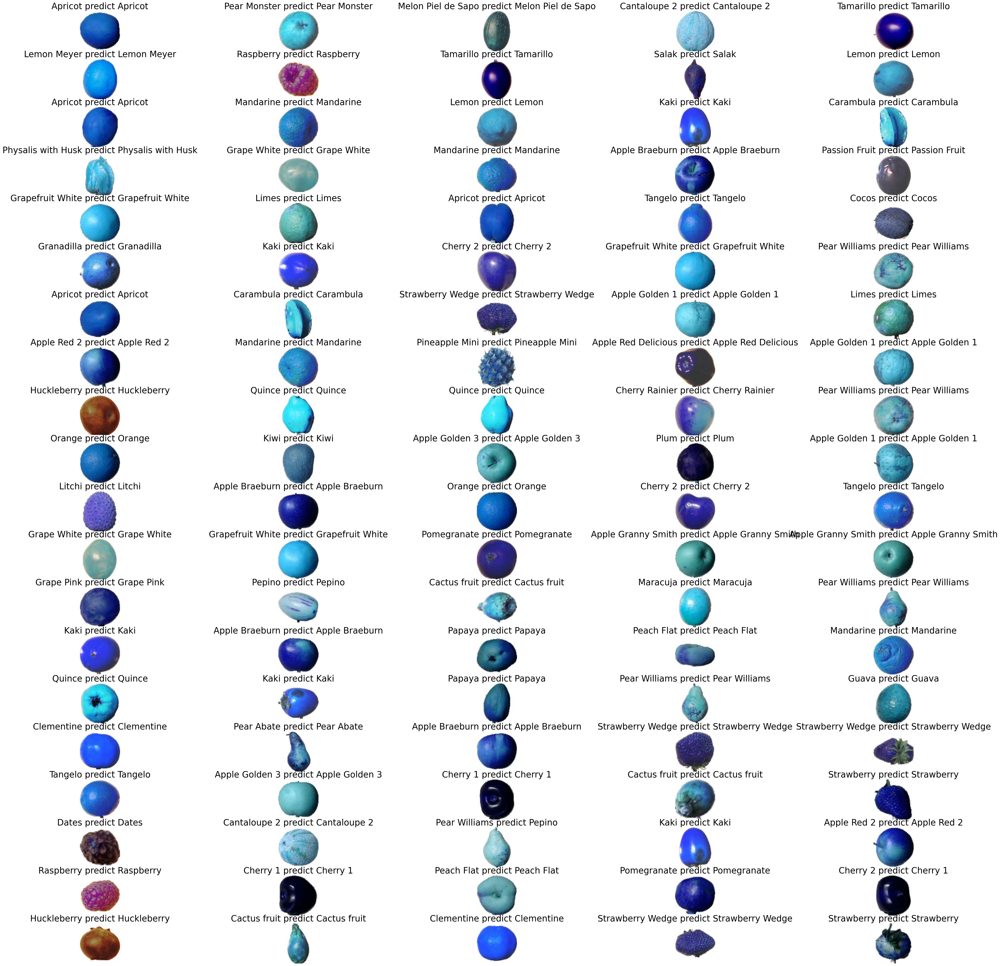

In [24]:
plt.figure(figsize=(50,50))
n=1
for i in range(100):
    plt.subplot(20,5,n)
    plt.imshow(X_test[i])
    plt.axis('off')
    ti=get_Name(y_test[i])+' predict '+pred_Name[i]
    plt.title(ti,fontsize=25)
   # plt.legend()
    n+=1

array([[144,   0,   0, ...,   0,   0,   0],
       [  0, 152,   0, ...,   0,   0,   0],
       [  0,   0, 153, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ..., 236,   0,   0],
       [  0,   0,   0, ...,   0, 153,   0],
       [  0,   0,   0, ...,   0,   0, 133]], dtype=int64)

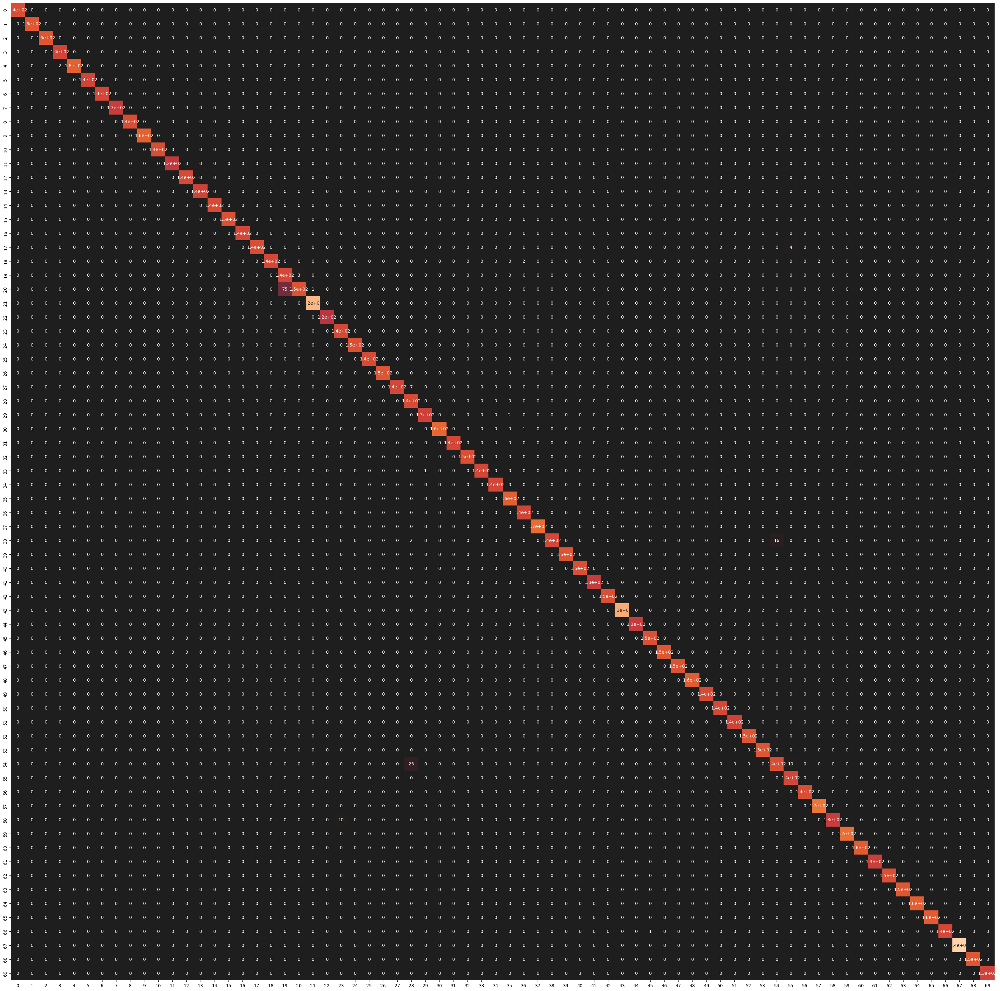

In [25]:
plt.figure(figsize=(40,40))
CM = confusion_matrix(y_test, pred_number)
sns.heatmap(CM, center = True,cbar=False,annot=True)
CM

In [26]:
ClassificationReport = classification_report(y_test,pred_number)
print('Classification Report is : ', ClassificationReport )


Classification Report is :                precision    recall  f1-score   support

           0       1.00      1.00      1.00       144
           1       1.00      1.00      1.00       152
           2       1.00      1.00      1.00       153
           3       0.99      1.00      0.99       137
           4       1.00      0.99      0.99       161
           5       1.00      1.00      1.00       137
           6       1.00      1.00      1.00       139
           7       1.00      1.00      1.00       130
           8       1.00      1.00      1.00       145
           9       1.00      1.00      1.00       160
          10       1.00      1.00      1.00       144
          11       1.00      1.00      1.00       125
          12       1.00      1.00      1.00       143
          13       1.00      1.00      1.00       135
          14       1.00      1.00      1.00       143
          15       1.00      1.00      1.00       146
          16       1.00      1.00      1.00       139

In [27]:
model.save('fruits-360/fruits_model2.model')

INFO:tensorflow:Assets written to: fruits-360/fruits_model2.model\assets


INFO:tensorflow:Assets written to: fruits-360/fruits_model2.model\assets
